In [1]:
pip install k-means-constrained

     |████████████████████████████████| 557 kB 5.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 14.4 MB 96 kB/s 
     |████████████████████████████████| 28.5 MB 51 kB/s 
  Using cached numpy-1.21.2-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (15.7 MB)
  Created wheel for k-means-constrained: filename=k_means_constrained-0.6.0-cp37-cp37m-linux_x86_64.whl size=1410488 sha256=caf8e4508f55507c135751748633904760b55f65e4691a574f80fc58521bade4
  Stored in directory: /root/.cache/pip/wheels/c1/71/49/3c504743f39dc4f94af42a1f4fa1ea8a9709c35101402bcd4f
Successfully built k-means-constrained
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successful

In [2]:
# Libraries:
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot, transforms
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
from k_means_constrained import KMeansConstrained
import warnings
warnings.filterwarnings("ignore")

In [3]:
# opening file:
df_original = pd.read_excel('/content/Consolidado Agosto 25.xlsx')
df_original.columns

Index(['Curso', 'ESTUDIANTE', 'DIRECCION', 'BARRIO', 'RUTA', 'SECTOR',
       'CIUDAD', 'Direccion_Clean', 'Direccion_final', 'Marker', 'latitudes',
       'longitudes', 'coordenadas'],
      dtype='object')

In [4]:
# file description:
df_original.describe(include='all')

,Curso,ESTUDIANTE,DIRECCION,BARRIO,RUTA,SECTOR,CIUDAD,Direccion_Clean,Direccion_final,Marker,latitudes,longitudes,coordenadas
count,1563,1564,1564,1534,1564.000000,1284.000000,1564,1553,1553,1553,1553.000000,1553.000000,1553
unique,120,1564,1425,620,NaN,NaN,11,1112,1074,1553,NaN,NaN,965
top,09G,GÓMEZ IZQUIERDO VALERIA,CLLE 12 # 25 90 CASA 36,GRAN GRANADA,NaN,NaN,BOGOTA,diagonal 77 b # 119 a 73,diagonal 77 b # 119 a 73 BOGOTA Colombia,DAVOODI PACHECO ESTEBAN ARIA calle 82 # 103 d 35,NaN,NaN,"(4.7226533, -74.12853799999999)"
freq,26,1,3,129,NaN,NaN,1226,12,13,1,NaN,NaN,15
mean,NaN,NaN,NaN,NaN,43.957161,10.908879,NaN,NaN,NaN,NaN,4.713273,-74.116457,NaN
std,NaN,NaN,NaN,NaN,27.735015,8.943851,NaN,NaN,NaN,NaN,0.047446,0.048044,NaN
min,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,4.600643,-74.282331,NaN
25%,NaN,NaN,NaN,NaN,18.750000,2.000000,NaN,NaN,NaN,NaN,4.687928,-74.130293,NaN
50%,NaN,NaN,NaN,NaN,45.000000,9.500000,NaN,NaN,NaN,NaN,4.714477,-74.113879,NaN
75%,NaN,NaN,NaN,NaN,70.000000,17.000000,NaN,NaN,NaN,NaN,4.729571,-74.088794,NaN


In [5]:
# checking for repeated students:
df_original['ESTUDIANTE'].value_counts().max()

1

In [ ]:
df = df_original.copy()
locations = df[['latitudes', 'longitudes']].dropna()
locationlist = locations.values.tolist()

In [22]:
folium_map=folium.Map()
STS = [4.710664, -74.124992]
folium_map=folium.Map(location= STS, zoom_start=12)
my_coor = zip(df.latitudes.dropna(), df.longitudes.dropna())
my_list_coor = list(my_coor)
hm_layer = HeatMap(my_list_coor)
folium_map=folium_map.add_child(hm_layer)
folium_map

In [14]:
# creating a new column to group by RUTA number:
df['Num_Ruta'] = 'Ruta_' + df['RUTA'].astype(str)

In [15]:
map2 = folium.Map(location=STS, zoom_start=12)
for point in range(0, len(locationlist)):
    folium.CircleMarker(locationlist[point], tooltip=df['ESTUDIANTE'][point], popup=df['Num_Ruta'][point], radius = 1.5, color='blue', fill=False).add_to(map2)
map2

In [16]:
map3 = folium.Map(location=STS, zoom_start=12)
folium.plugins.MarkerCluster(locations=locationlist, overlay=True, popups=df['Marker']).add_to(map3)
map3

In [17]:
def usuarios_ruta(ruta):
  return len(df[df['RUTA']== ruta])

In [18]:
def mapa_de_ruta(ruta):
  temp_df = df[df['RUTA']== ruta].reset_index()
  temp_locations =  temp_df[['latitudes', 'longitudes']]
  locationlist = temp_locations.values.tolist()
  temp_locationlist = temp_locations.values.tolist()
  avg_latitud = temp_df['latitudes'].mean()
  avg_longitud = temp_df['longitudes'].mean()
  avg_location = [avg_latitud, avg_longitud]
  map = folium.Map(location=avg_location, zoom_start=16)
  folium.plugins.MarkerCluster(locations=locationlist, overlay=True, popups=temp_df['Marker']).add_to(map)
  return map

In [19]:
usuarios_ruta(70)

15

In [20]:
mapa_de_ruta(70)

In [24]:
# mapa de suba
bogota = df[df['RUTA'] < 77 ].dropna()
suba = bogota[bogota['RUTA'] > 69]
locations_suba = suba[['latitudes', 'longitudes']]
locationlist_suba = locations_suba.values.tolist()
map4 = folium.Map(location=STS, zoom_start=12)
folium.plugins.MarkerCluster(locations=locationlist_suba, overlay=True, popups=suba['Marker']).add_to(map4)
map4

In [25]:
def mapa_de_sector_bogota(sector):
  temp_df = df[df['SECTOR']== sector].reset_index()
  temp_locations =  temp_df[['latitudes', 'longitudes']]
  locationlist = temp_locations.values.tolist()
  temp_locationlist = temp_locations.values.tolist()
  avg_latitud = temp_df['latitudes'].mean()
  avg_longitud = temp_df['longitudes'].mean()
  avg_location = [avg_latitud, avg_longitud]
  map = folium.Map(location=avg_location, zoom_start=16)
  folium.plugins.MarkerCluster(locations=locationlist, overlay=True, popups=temp_df['Marker']).add_to(map)
  return map

In [26]:
def usuarios_por_sector(sector):
  return len(df[df['SECTOR']== sector])

In [27]:
usuarios_por_sector(29)

45

In [28]:
mapa_de_sector_bogota(29)

In [29]:
mapa_de_ruta(10)

## Funciones:

In [30]:
def mapa_estatico_sector(sector):
  temp_df = df[df['SECTOR']== sector].reset_index()
  temp_locations =  temp_df[['latitudes', 'longitudes']]
  locationlist = temp_locations.values.tolist()
  temp_locationlist = temp_locations.values.tolist()
  avg_latitud = temp_df['latitudes'].mean()
  avg_longitud = temp_df['longitudes'].mean()
  avg_location = [avg_latitud, avg_longitud]
  map = folium.Map(location=avg_location, zoom_start=15)
  for point in range(0, len(locationlist)):
    folium.CircleMarker(locationlist[point], tooltip=temp_df['Marker'][point], popup=temp_df['Num_Ruta'][point], radius = 2.5, color='blue', fill=False).add_to(map)
  return map

In [31]:
def mapa_sector_y_ruta(sector):
  temp_df = df[df['SECTOR']== sector].reset_index()
  temp_locations = temp_df[['latitudes', 'longitudes']]
  locationlist = temp_locations.values.tolist()
  avg_latitud = temp_df['latitudes'].mean()
  avg_longitud = temp_df['longitudes'].mean()
  avg_location = [avg_latitud, avg_longitud]
  colors = ['blue', 'orange', 'green', 'red', 'purple','brown','black','magenta','cyan','gray','y']
  map = folium.Map(location=avg_location, zoom_start=15)
  counter = 0
  for i in temp_df[temp_df['SECTOR']==sector]['RUTA'].unique():
    temp2_df = temp_df[temp_df['RUTA']== i].reset_index()
    temp2_locations =  temp2_df[['latitudes', 'longitudes']]
    locationlist2 = temp2_locations.values.tolist() 
    for point in range(0, len(locationlist2)):
      folium.CircleMarker(locationlist2[point], tooltip=temp2_df['Marker'][point], popup=temp2_df['Num_Ruta'][point], radius = 2.5, color=colors[counter]).add_to(map)
    counter = counter + 1 
  return map

In [32]:
def rutas_por_sector(sector):
  temp_df = df[df['SECTOR']== sector]
  x = pd.DataFrame(temp_df['RUTA'].value_counts())
  return x.sort_index()

In [33]:
def scatterplot_sector(sector):
  temp_df = df[df['SECTOR']== sector]
  temp_df['RUTA str'] = temp_df['RUTA'].astype(str)
  plt.figure(figsize=(8, 8))
  return sns.scatterplot(y=temp_df.latitudes, x=temp_df.longitudes, hue=temp_df['RUTA str'])

In [34]:
def cluster_sector(sector, rutas, minimo, maximo):
  temp_df = df[df['SECTOR']== sector]
  temp_locations = np.array(temp_df[['latitudes','longitudes']])
  clf = KMeansConstrained(n_clusters=rutas, size_min=minimo, size_max=maximo, random_state=0)
  temp_df['cluster'] = clf.fit_predict(temp_locations).tolist()
  plt.figure(figsize=(8, 8))
  return sns.scatterplot(y=temp_df.latitudes, x=temp_df.longitudes, hue=temp_df['cluster'], palette='jet_r')

In [35]:
def comparacion_rutas(sector, rutas, minimo, maximo):
  temp_df = df[df['SECTOR']== sector]
  temp_locations = np.array(temp_df[['latitudes','longitudes']])
  clf = KMeansConstrained(n_clusters=rutas, size_min=minimo, size_max=maximo, random_state=0)
  temp_df['cluster'] = clf.fit_predict(temp_locations).tolist() 
  return temp_df

In [36]:
def mapa_de_sector_cluster_agrupado(df):
  temp_df = df
  temp_locations =  temp_df[['latitudes', 'longitudes']]
  locationlist = temp_locations.values.tolist()
  temp_locationlist = temp_locations.values.tolist()
  avg_latitud = temp_df['latitudes'].mean()
  avg_longitud = temp_df['longitudes'].mean()
  avg_location = [avg_latitud, avg_longitud]
  map = folium.Map(location=avg_location, zoom_start=16)
  folium.plugins.MarkerCluster(locations=locationlist, overlay=True, popups=temp_df['cluster'], name=temp_df['ESTUDIANTE']).add_to(map)
  return map

In [37]:
def mapa_sector_y_cluster(df_sector):
  temp_df = df_sector.reset_index()
  temp_locations = temp_df[['latitudes', 'longitudes']]
  locationlist = temp_locations.values.tolist()
  avg_latitud = temp_df['latitudes'].mean()
  avg_longitud = temp_df['longitudes'].mean()
  avg_location = [avg_latitud, avg_longitud]
  colors = ['blue', 'orange', 'green', 'red', 'purple','brown','black','magenta','cyan','yellow','gray']
  map = folium.Map(location=avg_location, zoom_start=15)
  counter = 0
  temp_df['cluster'] = temp_df['cluster'].astype(str)
  for i in temp_df['cluster'].unique():
    temp2_df = temp_df[temp_df['cluster']== i].reset_index()
    temp2_locations =  temp2_df[['latitudes', 'longitudes']]
    locationlist2 = temp2_locations.values.tolist() 
    for point in range(0, len(locationlist2)):
      folium.CircleMarker(locationlist2[point], tooltip=temp2_df['ESTUDIANTE'][point], popup=temp2_df['cluster'][point], radius = 2.5, color=colors[counter]).add_to(map)
    counter = counter + 1 
  return map

# SECTOR 1

## Comprende: 

Al norte de la calle 80 hasta los humedales, de la av Ciudad de Cali hacia el occidente.

In [38]:
mapa_estatico_sector(1)

In [39]:
rutas_por_sector(1)

,RUTA
1,33
2,32
3,34
4,33
10,16
11,14
12,4
53,1


In [40]:
mapa_sector_y_ruta(1)

## Nueva Distribución

In [41]:
usuarios_por_sector(1)

167

In [42]:
0.8*19, 0.8*40

(15.200000000000001, 32.0)

In [43]:
numero_de_grupos = usuarios_por_sector(1)/15
numero_de_grupos

11.133333333333333

Para el algoritmo se realiza k-means constrained con min 15 y max 16, obteniendo 11 grupos

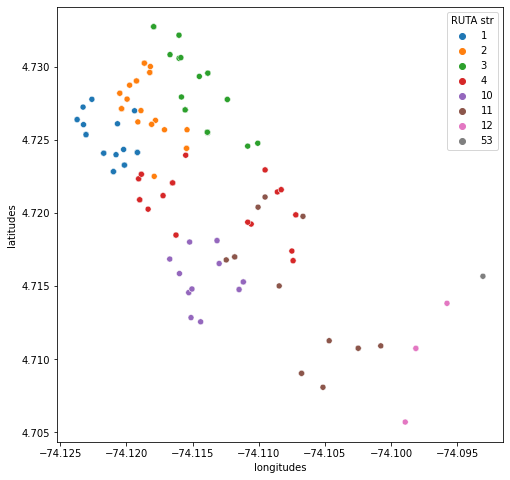

In [44]:
scatterplot_sector(1)

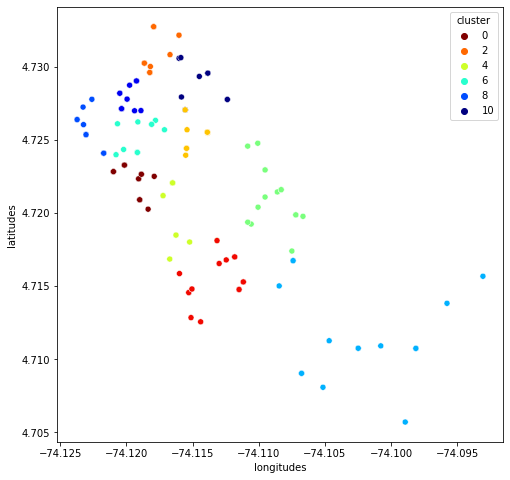

In [45]:
cluster_sector(1, 11, 15, 16)

In [46]:
sector1 = comparacion_rutas(1,11,15,16)

In [47]:
mapa_sector_y_cluster(sector1)

In [48]:
sector1.to_excel('rutas_sector_1.xlsx')

# SECTOR 2

## Comprende:

Al norte de la calle 80, hasta los humedales, y desde la Carrera 113 hacia el occidente.

In [49]:
mapa_estatico_sector(2)

In [50]:
usuarios_por_sector(2)

162

In [51]:
rutas_por_sector(2)

,RUTA
5,27
6,28
7,31
8,25
9,25
14,13
15,13


In [52]:
mapa_sector_y_ruta(2)

## Nueva Distribución

In [53]:
usuarios_por_sector(2)

162

In [54]:
numero_de_grupos = usuarios_por_sector(2)/15
numero_de_grupos

10.8

In [55]:
sector2 = comparacion_rutas(2,11,14,16)

In [56]:
mapa_sector_y_cluster(sector2)

In [57]:
sector2.to_excel('rutas_sector_2.xlsx')

# Sector 3

In [58]:
mapa_estatico_sector(3)

In [59]:
usuarios_por_sector(3)

39

In [60]:
rutas_por_sector(3)

,RUTA
12,7
13,16
53,16


In [61]:
mapa_sector_y_ruta(3)

In [62]:
numero_de_grupos = usuarios_por_sector(3)/15
numero_de_grupos

2.6

In [63]:
sector3 = comparacion_rutas(3,3,13,13)

In [64]:
mapa_sector_y_cluster(sector3)

# Sector 4

In [65]:
mapa_estatico_sector(4)

In [66]:
rutas_por_sector(4)

,RUTA
16,13
17,13
20,14
21,15


In [67]:
usuarios_por_sector(4)

55

In [68]:
mapa_sector_y_ruta(4)

In [69]:
numero_de_grupos = usuarios_por_sector(4)/15
numero_de_grupos

3.6666666666666665

In [70]:
sector4 = comparacion_rutas(4,4,13,15)

In [71]:
mapa_sector_y_cluster(sector4)

In [72]:
mapa_sector_y_ruta(5)

In [73]:
usuarios_por_sector(5)

83

In [74]:
rutas_por_sector(5)

,RUTA
18,14
19,11
22,14
23,28
24,15
30,1


In [75]:
numero_de_grupos = usuarios_por_sector(5)/15
numero_de_grupos

5.533333333333333

In [76]:
sector5 = comparacion_rutas(5,6,13,15)

In [77]:
mapa_sector_y_cluster(sector5)

In [78]:
mapa_estatico_sector(19)

In [79]:
mapa_sector_y_ruta(19)

In [80]:
usuarios_por_sector(19)

20

In [81]:
rutas_por_sector(19)

,RUTA
56,5
57,12
58,2
60,1


In [82]:
sector19 = comparacion_rutas(19,2,10,10)
mapa_sector_y_cluster(sector19)

In [83]:
mapa_sector_y_ruta(20)

In [84]:
rutas_por_sector(20)

,RUTA
58,12
59,16
61,2
62,16


In [85]:
usuarios_por_sector(20)

46

In [86]:
sector20 = comparacion_rutas(20,3,15,16)
mapa_sector_y_cluster(sector20)

In [87]:
mapa_sector_y_ruta(11)

In [88]:
usuarios_por_sector(11)

50

In [89]:
sector11 = comparacion_rutas(11,4,12,13)
mapa_sector_y_cluster(sector11)

In [90]:
mapa_sector_y_ruta(16)

In [91]:
usuarios_por_sector(16)

46

In [92]:
sector16 = comparacion_rutas(16,3,15,16)
mapa_sector_y_cluster(sector16)

In [93]:
mapa_sector_y_ruta(22)

In [94]:
usuarios_por_sector(22)

37

In [95]:
sector22 = comparacion_rutas(22,3,12,13)
mapa_sector_y_cluster(sector22)

In [96]:
mapa_sector_y_ruta(25)

In [97]:
usuarios_por_sector(25)

35

In [98]:
sector25 = comparacion_rutas(25,3,11,13)
mapa_sector_y_cluster(sector25)

In [99]:
mapa_estatico_sector(6)

In [100]:
usuarios_por_sector(6)

69

In [101]:
rutas_por_sector(6)

,RUTA
25,14
26,7
27,12
28,13
29,11
30,12


In [102]:
mapa_sector_y_ruta(6)

In [103]:
sector6 = comparacion_rutas(6,5,13,14)
mapa_sector_y_cluster(sector6)

In [104]:
rutas_por_sector(11)

,RUTA
38,12
39,12
40,11
43,1
44,12
47,2


In [105]:
usuarios_por_sector(12)

71

In [106]:
usuarios_por_sector(11)

50

In [107]:
rutas_por_sector(12)

,RUTA
40,5
41,15
42,13
43,14
45,24


In [108]:
mapa_de_ruta(40)

# Sector X

mapa_estatico_sector() \
usuarios_por_sector() \
rutas_por_sector() \
mapa_sector_y_ruta() \

numero_de_grupos = usuarios_por_sector()/15 \
numero_de_grupos \

sectorX = comparacion_rutas(X,Y,14,16) \
mapa_sector_y_cluster(sectorX) \
sectorX.to_excel('rutas_sector_X.xlsx')

In [109]:
mapa_de_ruta(47)

In [110]:
mapa_de_sector_bogota(13)

In [111]:
rutas_por_sector(13)

,RUTA
46,30
47,1
49,15


In [112]:
usuarios_ruta(49)

16

In [113]:
mapa_de_ruta(49)